# ECE 285 IVR Project C - Wavelet based image restoration

## ShuChang Liu A53276224, Arik Horodniceanu A53285765, Weihua Huang A53274052

In [3]:
%load_ext autoreload
%autoreload 2
import numpy as np
import numpy.fft as npf
import matplotlib
import matplotlib.pyplot as plt
import time
from imagetools import LinearOperator
from sklearn.neighbors import NearestNeighbors
import imagetools.projectC as im
%matplotlib notebook

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## 1 Operators

#### 1.

In [4]:
class Identity(LinearOperator):
    def __init__(self, ishape, oshape=None):
        LinearOperator.__init__(self, ishape, oshape=None)
        self._ishape = ishape
    def __call__(self, x):
        return x
    def adjoint(self, x):
        return x
    def gram(self, x):
        return x
    def gram_resolvent(self, x, tau):
        return (1/(1+tau))*x

#### 2.

In [5]:
class Convolution(LinearOperator):
    def __init__(self, ishape, nu=None, oshape=None):
        LinearOperator.__init__(self, ishape, oshape=None)
        self.nu = nu
        self.mu = np.flip(self.nu,1)[::-1]
        self.H = im.kernel2fft(self.nu, ishape[0], ishape[1])
        self.H_star = im.kernel2fft(self.mu, ishape[0], ishape[1])
        self._ishape = ishape
    def __call__(self, x):
        return im.convolvefft(x, self.H)
    def adjoint(self, x):
        return im.convolvefft(x, self.H_star)
    def gram(self, x):
        return im.convolvefft(x, self.H*self.H_star)
    def gram_resolvent(self, x, tau):
        res_lbd = 1 / (1 + tau * self.H*self.H_star)
        return im.convolvefft(x, res_lbd)

#### 3.

In [6]:
class RandomMasking(LinearOperator):
    def __init__(self, ishape, p = 0, oshape=None):
        LinearOperator.__init__(self, ishape, oshape=None)
        self.ishape_ = ishape
        self.p = p
        c = 3 if len(self.ishape_) == 3 else 1 # color image
        self.c = c
        n1,n2 = self.ishape_[0:2]
        self.n1, self.n2 = n1, n2
        self.mask_pos = np.random.choice(n1*n2*c,int(self.p*n1*n2*c),replace = False)
    def __call__(self, x):
        x_copy = x.copy()
        x_copy = np.reshape(x_copy,self.n1*self.n2*self.c)
        x_copy[self.mask_pos] = 0
        x_copy = np.reshape(x_copy,(self.n1,self.n2,self.c))
        return x_copy
    def adjoint(self, x):
        return self(x)
    def gram(self, x):
        return self.adjoint(self(x))
    def gram_resolvent(self, x, tau):
        return im.cg(lambda z: z + tau * self.gram(z), x)

#### 4.

<IPython.core.display.Javascript object>


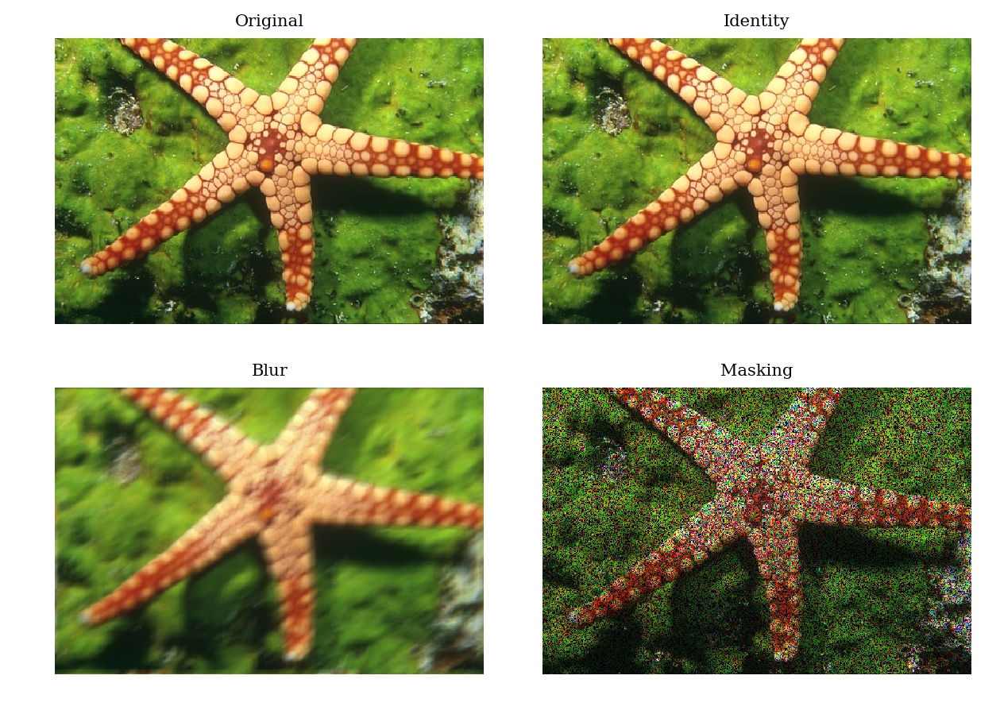

In [6]:
starfish = plt.imread('assets/starfish.png')
nu = im.kernel("motion")
y_conv = Convolution(starfish.shape,nu)
y_identity = Identity(starfish.shape)
y_randmask = RandomMasking(starfish.shape, p=0.4)
plt.figure(figsize=(7,5))
plt.subplot(2,2,1)
im.show(starfish)
plt.title("Original")
plt.subplot(2,2,2)
im.show(np.clip(y_identity(starfish),0,1))
plt.title("Identity")
plt.subplot(2,2,3)
im.show(np.clip(y_conv(starfish),0,1))
plt.title("Blur")
plt.subplot(2,2,4)
im.show(np.clip(y_randmask(starfish),0,1))
plt.title("Masking")
plt.show()

#### 5.

In [7]:
x = plt.imread('assets/jockeys.png')
y = plt.imread('assets/zebra.png')
H_identity = Identity(x.shape)
nu = im.kernel("motion")
H_conv = Convolution(x.shape,nu)
H_randmask = RandomMasking(x.shape, p=0.4)

In [8]:
print("Identity Check:",np.isclose(np.sum(H_identity(x)*y),np.sum(x*H_identity.adjoint(y))))
print("Convolution Check:",np.isclose(np.sum(H_conv(x)*y),np.sum(x*H_conv.adjoint(y))))
print("Random Masking Check:",np.isclose(np.sum(H_randmask(x)*y),np.sum(x*H_randmask(y))))

Identity Check: True
Convolution Check: True
Random Masking Check: True


#### 6.

In [9]:
x = plt.imread('assets/jockeys.png')
tau = 0.1
print("Identity Check:",np.allclose(H_identity.gram_resolvent((x+tau*H_identity.gram(x)),tau),x))
print("Convolution Check:",np.allclose(H_conv.gram_resolvent((x+tau*H_conv.gram(x)),tau),x))
print("Random Masking Check:",np.allclose(H_randmask.gram_resolvent((x+tau*H_randmask.gram(x)),tau),x))

Identity Check: True
Convolution Check: True
Random Masking Check: True


## 2 Discrete Wavelet Transform

#### 7.

In [7]:
def dwt(x, J, h, g): 
    if J == 0:
        return x
    n1, n2 = x.shape[:2]
    m1, m2 = (int(n1 / 2), int(n2 / 2))
    z = dwt1d(x, h, g, 0)
    z = np.swapaxes(dwt1d(np.swapaxes(z,0,1), h, g, 1),0,1)
    z[:m1, :m2] = dwt(z[:m1, :m2], J - 1, h, g)
    return z

In [8]:
def dwt1d(x, h, g, ax): 
    coarse = im.convolve(x, g)
    detail = im.convolve(x, h)
    z = np.concatenate((coarse[::2, :], detail[::2, :]), axis=0)
    return z

#### 8.

<IPython.core.display.Javascript object>


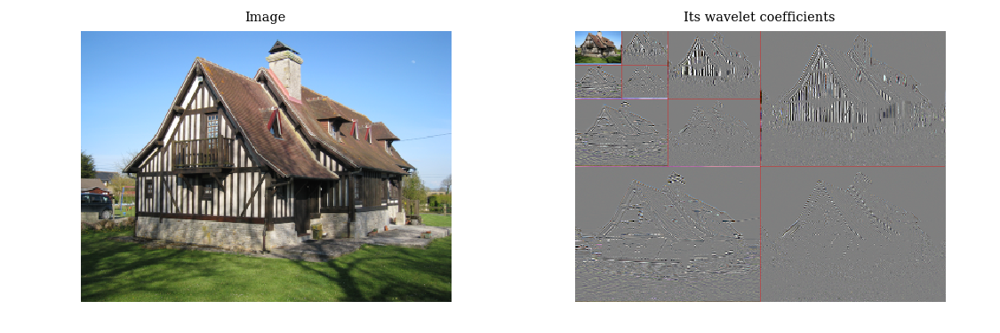

In [9]:
x0 = plt.imread('assets/normandy.png')
x0 = im.dtw_crop(x0,3)
h0,g0 = im.wavelet(name="db2",d=2)
x0_dwt = dwt(x0,J=3, h=h0, g=g0)
plt.figure(figsize=(9,3))
plt.subplot(1,2,1)
im.show(x0)
plt.title("Image")
plt.subplot(1,2,2)
im.showdwt(x0_dwt, J=3)
plt.title("Its wavelet coefficients")
plt.show()

#### 9.

In [10]:
def idwt(z, J, h, g): # 2d and multi-scale
    if J == 0:
        return z
    n1, n2 = z.shape[:2]
    m1, m2 = (int(n1 / 2), int(n2 / 2))
    x = z.copy()
    x[:m1, :m2] = idwt(x[:m1, :m2], J - 1, h, g)
    x = np.swapaxes((idwt1d(np.swapaxes(x,0,1), h, g)),0,1)
    x = idwt1d(x, h, g)
    return x

In [11]:
def idwt1d(z, h, g): # 1d and 1scale
    n1 = z.shape[0]
    m1 = int(n1 / 2)
    coarse, detail = np.zeros(z.shape), np.zeros(z.shape)
    coarse[::2, :], detail[::2, :] = z[:m1, :], z[m1:, :]
    x = im.convolve(coarse, g[::-1]) + im.convolve(detail, h[::-1])
    return x

#### 10.

In [12]:
x0_left = dwt(idwt(x0,J=3, h=h0, g=g0),J=3, h=h0, g=g0)
x0_right = idwt(dwt(x0,J=3, h=h0, g=g0),J=3, h=h0, g=g0)

<IPython.core.display.Javascript object>


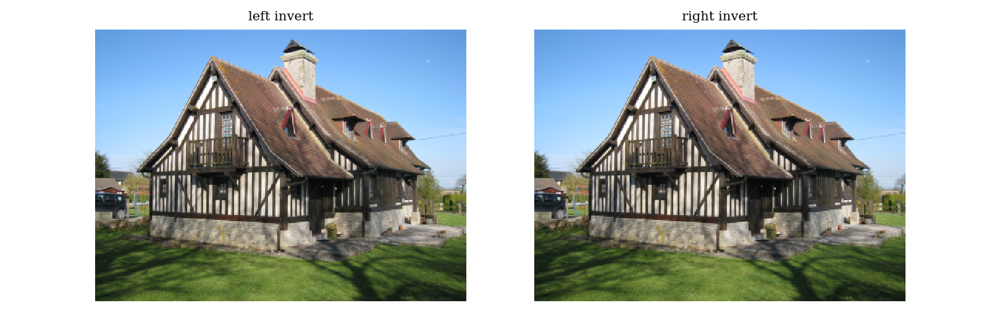

In [16]:
plt.figure(figsize=(9,3))
plt.subplot(1,2,1)
im.show(x0_left)
plt.title("left invert")
plt.subplot(1,2,2)
im.show(x0_right)
plt.title("right invert")
plt.show()

In [13]:
x_check = plt.imread('assets/house.png')
y_check = plt.imread('assets/map.png')
x_check = im.dtw_crop(x_check,3)
y_check = im.dtw_crop(y_check,3)
h0,g0 = im.wavelet(name="db2",d=2)
x_check_dwt = dwt(x_check,J=3, h=h0, g=g0)
y_check_idwt = idwt(y_check,J=3, h=h0, g=g0)
print("check left invert equals to right invert:", np.allclose(x0_left, x0_right))
print("check whether idwt is adjoint of dwt:",np.isclose(np.sum(x_check_dwt*y_check), np.sum(x_check*y_check_idwt)))
print("check left invert equals to right invert equal to original:", np.allclose(x0_left, x0))

check left invert equals to right invert: True
check whether idwt is adjoint of dwt: True
check left invert equals to right invert equal to original: True


#### Check whether idwt is adjoint of dwt: 
#### idwt is adjoint of dwt.
#### How is a linear operation called when its inverse is its own adjoint?
#### This kind of linear operation is called a unitary operation.

#### 11.

In [19]:
# ProjectC.py
# def dwt(x, J, h, g): 
#     if J == 0:
#         return x
#     n1, n2 = x.shape[:2]
#     m1, m2 = (int(n1 / 2), int(n2 / 2))
#     z = dwt1d(x, h, g, 0)
#     z = np.swapaxes(dwt1d(np.swapaxes(z,0,1), h, g, 1),0,1)
#     z[:m1, :m2] = dwt(z[:m1, :m2], J - 1, h, g)
#     return z

# def dwt1d(x, h, g, ax): 
#     coarse = convolve(x, g)
#     detail = convolve(x, h)
#     z = np.concatenate((coarse[::2, :], detail[::2, :]), axis=0)
#     return z

# def idwt(z, J, h, g): # 2d and multi-scale
#     if J == 0:
#         return z
#     n1, n2 = z.shape[:2]
#     m1, m2 = (int(n1 / 2), int(n2 / 2))
#     x = z.copy()
#     x[:m1, :m2] = idwt(x[:m1, :m2], J - 1, h, g)
#     x = np.swapaxes((idwt1d(np.swapaxes(x,0,1), h, g)),0,1)
#     x = idwt1d(x, h, g)
#     return x

# def idwt1d(z, h, g): # 1d and 1scale
#     n1 = z.shape[0]
#     m1 = int(n1 / 2)
#     coarse, detail = np.zeros(z.shape), np.zeros(z.shape)
#     coarse[::2, :], detail[::2, :] = z[:m1, :], z[m1:, :]
#     x = convolve(coarse, g[::-1]) + convolve(detail, h[::-1])
#     return x


# class DWT(LinearOperator):
#     def __init__(self, ishape, J, name):
#         oshape = list(ishape)
#         oshape.insert(2, 2)
#         oshape = tuple(oshape)
#         LinearOperator.__init__(self, ishape, oshape)
#         self.n1, self.n2 = ishape[:2]
#         if len(ishape)==3:
#             self.ndims = 3
#         elif len(ishape)==2:
#             self.ndims =2
#         else:
#             self.ndims =1
#         self.J = J
#         self.h,self.g = wavelet(name=name,d=2)
        

#     def __call__(self, x):
#         x = dtw_crop(x,self.J)
#         return dwt(x, J=self.J, h=self.h, g=self.g)

#     def adjoint(self, x):
#         return idwt(x,J=self.J, h=self.h, g=self.g)

#     def gram(self, x):
#         return self.adjoint(self(x))

#     def gram_resolvent(self, x, tau):
#         return cg(lambda z: z + tau * self.gram(z), x)
        
#     def invert(self, x):
#         return self.adjoint(x)
    
#     def power(self):
#         return dwt_power(self.n1, self.n2,self.J,self.ndims)

In [20]:
x = plt.imread('assets/house.png')
W = im.DWT(x.shape, name='db2',J=3)
print("check x = W.invert(W(x)):", np.allclose(x, W.invert(W(x))))
print("check x = W(W.invert(x)):", np.allclose(x, W(W.invert(x))))

check x = W.invert(W(x)): True
check x = W(W.invert(x)): True


#### 12.

In [13]:
def softthresh(z, t):
    return np.sign(z) * (np.maximum(np.abs(z),t)-t)

#### 13.

In [14]:
def softthresh_denoise(y, sig, W, alpha=10/255):
    p = W.power()
    lam = p*alpha
    tau = np.sqrt(2)*sig**2/lam
    return W.invert(softthresh(W(y),tau))

#### 14.

In [15]:
def psnr(x, x0):
    n1, n2 = x.shape[0:2]
    c = x.shape[2] if x.ndim == 3 else 1
    n = n1*n2*c
    return 10*np.log10(1/(1/n*np.linalg.norm(x-x0)**2))

In [42]:
sig = 20 / 255
x0 = plt.imread('assets/dragonfly.png')
x0 = im.dtw_crop(x0,3)
W = im.DWT(x0.shape, name='db2',J=3)
y = x0 + sig * np.random.randn(*x0.shape)
alpha_value = np.linspace(5.5/255, 15/255,100)
psnr_arr = np.zeros(100)
t1 = time.time()
for i in range(100):
    psnr_arr[i] = psnr(softthresh_denoise(y, sig, W, alpha=alpha_value[i]),x0)
t2 = time.time()-t1   

In [43]:
# For comparison in last section
alpha_max = np.argmax(psnr_arr)
best_softthresh_dwt = softthresh_denoise(y, sig, W,alpha = alpha_value[alpha_max])
best_softthresh_dwt_snr = psnr_arr[alpha_max]

<IPython.core.display.Javascript object>


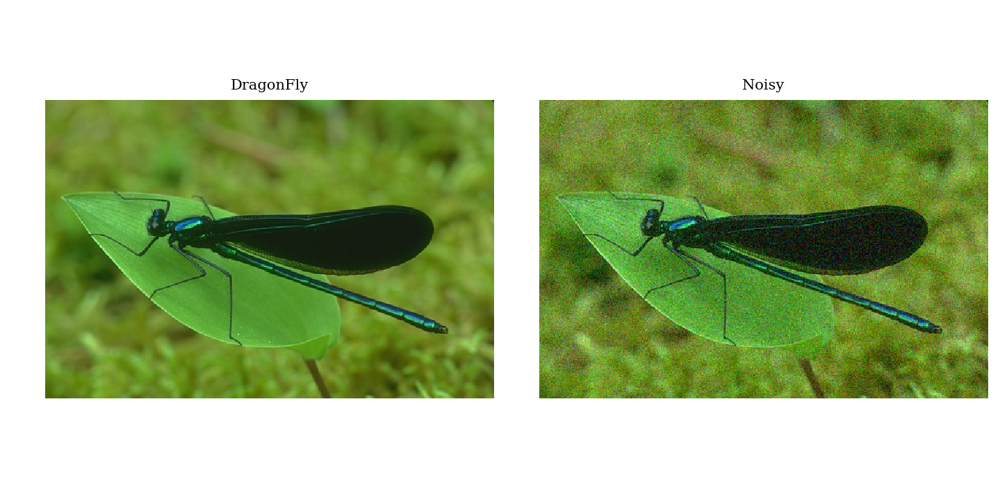

<IPython.core.display.Javascript object>


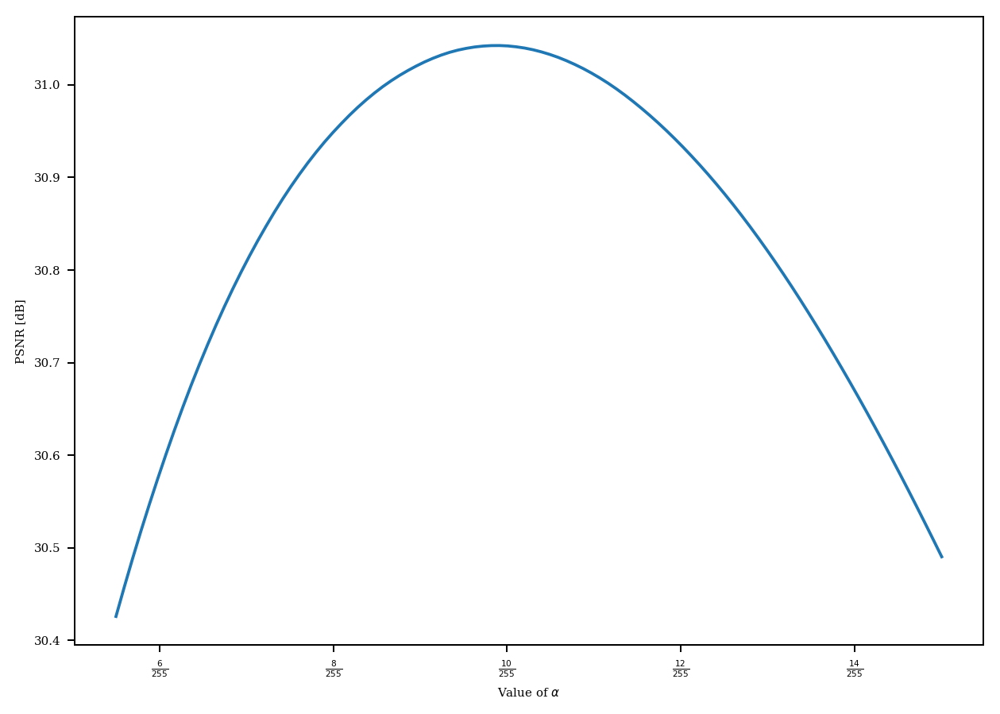

DWT run time: 17.97 sec


In [26]:
plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
im.show(x0)
plt.title("DragonFly")
plt.subplot(1,2,2)
im.show(y)
plt.title("Noisy")
plt.figure(figsize=(7,5))
plt.plot(alpha_value, psnr_arr)
plt.xticks([6/255,8/255,10/255,12/255,14/255],
           [r"$\frac{6}{255}$",r"$\frac{8}{255}$",r"$\frac{10}{255}$",
                            r"$\frac{12}{255}$",r"$\frac{14}{255}$"])
plt.xlabel("Value of $\\alpha$")
plt.ylabel("PSNR [dB]")
plt.show()
print("DWT run time: " + "{0:.2f}".format(t2) + ' sec')

## 3 Undecimated Discrete Wavelet Transform

#### 15.

In [16]:
def interleave0(x):
    n1,n2 = x.shape[:2]
    result = np.zeros((2*n1,n2))
    result[::2,:] = x
    return result[:2*n1-1].reshape(2*n1-1,n2)

In [17]:
def udwt(x, J, h, g):
    if J == 0:
        return x[:, :, None]
    tmph = np.swapaxes(im.convolve(np.swapaxes(x,0,1), h),0,1) /2
    tmpg = np.swapaxes(im.convolve(np.swapaxes(x,0,1), g),0,1) /2
    z = np.stack((im.convolve(tmpg, h),
                  im.convolve(tmph, g),
                  im.convolve(tmph, h)), axis=2)
    coarse = im.convolve(tmpg, g)
    h2 = interleave0(h)
    g2 = interleave0(g)
    z = np.concatenate((udwt(coarse, J - 1, h2, g2), z), axis=2)
    return z

#### 16.

In [29]:
x0 = plt.imread('assets/dragonfly.png')
h0,g0 = im.wavelet(name="db2",d=2)
x0_udwt = udwt(x0,J=3, h=h0,g=g0)

<IPython.core.display.Javascript object>


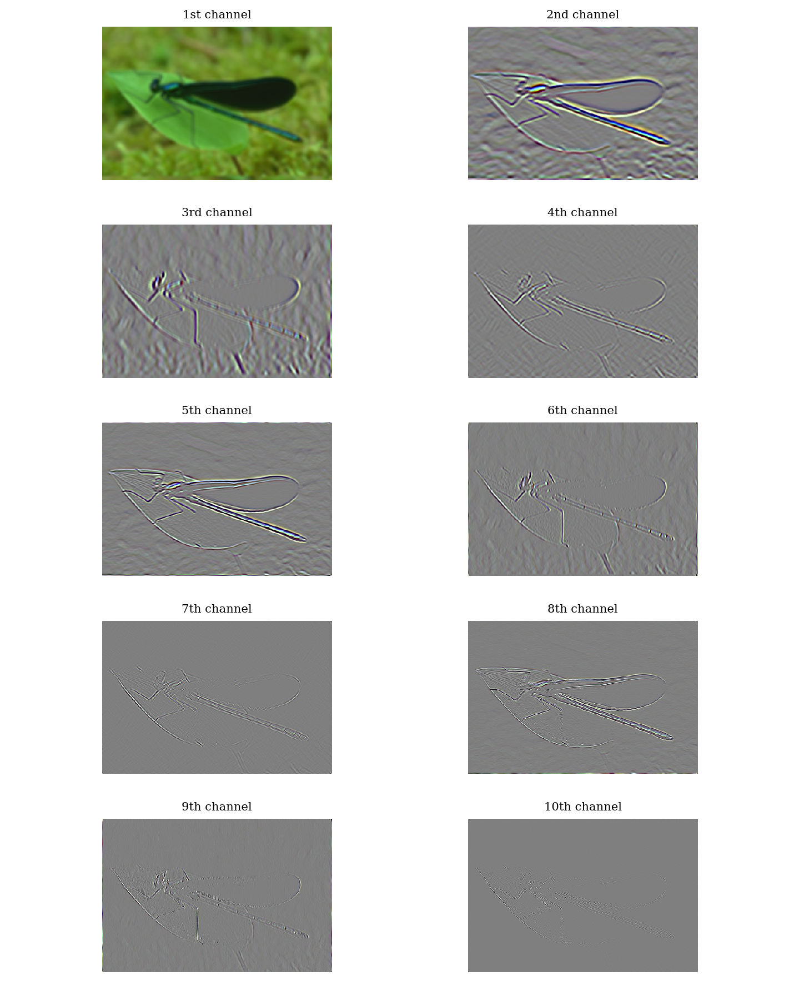

In [30]:
plt.figure(figsize=(8,10))
plt.subplot(5,2,1)
im.show(x0_udwt[:,:,0,:])
plt.title("1st channel")
plt.subplot(5,2,2)
im.show(x0_udwt[:,:,1,:],vmin=-.1,vmax=.1)
plt.title("2nd channel")
plt.subplot(5,2,3)
im.show(x0_udwt[:,:,2,:],vmin=-.1,vmax=.1)
plt.title("3rd channel")
plt.subplot(5,2,4)
im.show(x0_udwt[:,:,3,:],vmin=-.1,vmax=.1)
plt.title("4th channel")
plt.subplot(5,2,5)
im.show(x0_udwt[:,:,4,:],vmin=-.1,vmax=.1)
plt.title("5th channel")
plt.subplot(5,2,6)
im.show(x0_udwt[:,:,5,:],vmin=-.1,vmax=.1)
plt.title("6th channel")
plt.subplot(5,2,7)
im.show(x0_udwt[:,:,6,:],vmin=-.1,vmax=.1)
plt.title("7th channel")
plt.subplot(5,2,8)
im.show(x0_udwt[:,:,7,:],vmin=-.1,vmax=.1)
plt.title("8th channel")
plt.subplot(5,2,9)
im.show(x0_udwt[:,:,8,:],vmin=-.1,vmax=.1)
plt.title("9th channel")
plt.subplot(5,2,10)
im.show(x0_udwt[:,:,9,:],vmin=-.1,vmax=.1)
plt.title("10th channel")
plt.show()

These results match what was shown in the lecture. The 1st channel is the coarse scale which is the original image through a LPF. The 2nd channel is the first horizontal derivative fine scale channel, the 3rd channel is the first vertical derivative fine scale channel, the 4th channel is is the first diagonal derivative fine scale channel, the 5th is the 2nd horizontal derivative fine scale channel and so on. Overall it looks like our implementation is correct.

#### 17.

In [18]:
def iudwt(z, J, h, g):
    if J == 0:
        return z[:,:,0]
    h2 = interleave0(h)
    g2 = interleave0(g)
    coarse = iudwt(z[:, :, :-3], J - 1, h2, g2)
    tmpg = im.convolve(coarse, g[::-1]) + im.convolve(z[:, :, -3], h[::-1])
    tmph = im.convolve(z[:, :, -2], g[::-1]) + im.convolve(z[:, :, -1], h[::-1])
    x = (np.swapaxes(im.convolve(np.swapaxes(tmpg,0,1), g[::-1]),0,1) +
         np.swapaxes(im.convolve(np.swapaxes(tmph,0,1), h[::-1]),0,1))/2
    return x

#### 18.

In [32]:
x_left1 = np.random.rand(256,256,10,3)
print("Check left invert:",np.allclose(udwt(iudwt(x_left1,J=3, h=h0, g=g0),J=3, h=h0, g=g0),x_left1))
x_right1 = np.random.rand(256,256,3)
print("Check right invert:",np.allclose(iudwt(udwt(x_right1,J=3, h=h0, g=g0),J=3, h=h0, g=g0),x_right1))

Check left invert: False
Check right invert: True


#### The left invert is not equal to original image, the right invert is equal to the original coefficients. Coincides with was taught in lecture.

In [33]:
x_check1 = np.random.rand(256,256,3)
y_check1 = np.random.rand(256,256,10,3)
h0,g0 = im.wavelet(name="db2",d=2)
x_check_udwt = udwt(x_check1,J=3, h=h0, g=g0)
y_check_iudwt = iudwt(y_check1,J=3, h=h0, g=g0)
print("Check whether iudwt is adjoint of udwt:",
      np.isclose(np.sum(x_check_udwt*y_check1), np.sum(x_check1*y_check_iudwt)))

Check whether iudwt is adjoint of udwt: True


#### Check whether iudwt is adjoint of udwt:
#### iudwt is adjoint of udwt.
#### Is the UDWT invertible? 
#### No.

#### 19.

In [19]:
def fftpad(x,n):
    length = x.shape[0]
    result = np.zeros((n,1))
    result[:length,:] = x
    return result

In [20]:
def udwt_create_fb(n1, n2, J, h, g, ndim=3):
    if J == 0:
        return np.ones((n1, n2, 1, *[1] * (ndim - 2)))
    h2 = interleave0(h)
    g2 = interleave0(g)
    fbrec = udwt_create_fb(n1, n2, J - 1, h2, g2, ndim=ndim)
    gf1 = npf.fft(fftpad(g, n1), axis=0)
    hf1 = npf.fft(fftpad(h, n1), axis=0)
    gf2 = npf.fft(fftpad(g, n2), axis=0)
    hf2 = npf.fft(fftpad(h, n2), axis=0)
    fb = np.zeros((n1, n2, 4), dtype=np.complex128)
    fb[:, :, 0] = np.outer(gf1, gf2) / 2
    fb[:, :, 1] = np.outer(gf1, hf2) / 2
    fb[:, :, 2] = np.outer(hf1, gf2) / 2
    fb[:, :, 3] = np.outer(hf1, hf2) / 2
    fb = fb.reshape(n1, n2, 4, *[1] * (ndim - 2))
    fb = np.concatenate((fb[:, :, 0:1] * fbrec, fb[:, :, -3:]),axis=2)
    return fb

In [21]:
def fb_apply(x, fb):
    x = npf.fft2(x, axes=(0, 1))
    z = fb * x[:, :, None]
    z = np.real(nf.ifft2(z, axes=(0, 1)))
    return z

In [22]:
def fb_adjoint(z, fb, squeeze=True):
    z = npf.fft2(z, axes=(0, 1))
    x = (np.conj(fb) * z).sum(axis=2)
    x = np.real(nf.ifft2(x, axes=(0, 1)))
    return x

#### 20.

In [39]:
# ProjectC.py
# def interleave0(x):
#     n1,n2 = x.shape[:2]
#     result = np.zeros((2*n1,n2))
#     result[::2,:] = x
#     return result[:2*n1-1].reshape(2*n1-1,n2)

# def udwt(x, J, h, g):
#     if J == 0:
#         return x[:, :, None]
#     tmph = np.swapaxes(convolve(np.swapaxes(x,0,1), h),0,1) /2
#     tmpg = np.swapaxes(convolve(np.swapaxes(x,0,1), g),0,1) /2
#     z = np.stack((convolve(tmpg, h),
#                   convolve(tmph, g),
#                   convolve(tmph, h)), axis=2)
#     coarse = convolve(tmpg, g)
#     h2 = interleave0(h)
#     g2 = interleave0(g)
#     z = np.concatenate((udwt(coarse, J - 1, h2, g2), z), axis=2)
#     return z

# def iudwt(z, J, h, g):
#     if J == 0:
#         return z[:,:,0]
#     h2 = interleave0(h)
#     g2 = interleave0(g)
#     coarse = iudwt(z[:, :, :-3], J - 1, h2, g2)
#     tmpg = convolve(coarse, g[::-1]) + convolve(z[:, :, -3], h[::-1])
#     tmph = convolve(z[:, :, -2], g[::-1]) + convolve(z[:, :, -1], h[::-1])
#     x = (np.swapaxes(convolve(np.swapaxes(tmpg,0,1), g[::-1]),0,1) +
#          np.swapaxes(convolve(np.swapaxes(tmph,0,1), h[::-1]),0,1))/2
#     return x

# def fftpad(x,n):
#     length = x.shape[0]
#     result = np.zeros((n,1))
#     result[:length,:] = x
#     return result

# def udwt_create_fb(n1, n2, J, h, g, ndim=3):
#     if J == 0:
#         return np.ones((n1, n2, 1, *[1] * (ndim - 2)))
#     h2 = interleave0(h)
#     g2 = interleave0(g)
#     fbrec = udwt_create_fb(n1, n2, J - 1, h2, g2, ndim=ndim)
#     gf1 = npf.fft(fftpad(g, n1), axis=0)
#     hf1 = npf.fft(fftpad(h, n1), axis=0)
#     gf2 = npf.fft(fftpad(g, n2), axis=0)
#     hf2 = npf.fft(fftpad(h, n2), axis=0)
#     fb = np.zeros((n1, n2, 4), dtype=np.complex128)
#     fb[:, :, 0] = np.outer(gf1, gf2) / 2
#     fb[:, :, 1] = np.outer(gf1, hf2) / 2
#     fb[:, :, 2] = np.outer(hf1, gf2) / 2
#     fb[:, :, 3] = np.outer(hf1, hf2) / 2
#     fb = fb.reshape(n1, n2, 4, *[1] * (ndim - 2))
#     fb = np.concatenate((fb[:, :, 0:1] * fbrec, fb[:, :, -3:]),axis=2)
#     return fb

# def fb_apply(x, fb):
#     x = npf.fft2(x, axes=(0, 1))
#     z = fb * x[:, :, None]
#     z = np.real(nf.ifft2(z, axes=(0, 1)))
#     return z

# def fb_adjoint(z, fb, squeeze=True):
#     z = npf.fft2(z, axes=(0, 1))
#     x = (np.conj(fb) * z).sum(axis=2)
#     x = np.real(nf.ifft2(x, axes=(0, 1)))
#     return x

    
# class UDWT(LinearOperator):
#     def __init__(self, ishape, J, name, using_fb=True):
#         oshape = list(ishape)
#         oshape.insert(2, 2)
#         oshape = tuple(oshape)
#         LinearOperator.__init__(self, ishape, oshape)
#         self.n1, self.n2 = ishape[:2]
#         if len(ishape)==3:
#             self.ndims = 3
#         elif len(ishape)==2:
#             self.ndims =2
#         else:
#             self.ndims =1
#         self.J = J
#         self.h,self.g = wavelet(name=name,d=2)
#         self.using_fb = using_fb
#         if self.using_fb is True:
#             self.fb = udwt_create_fb(self.n1, self.n2, self.J, self.h, self.g, self.ndims)
#         else:
#             self.fb = None
        

#     def __call__(self, x):
#         if self.using_fb is False:
#             return udwt(x, J=self.J, h=self.h, g=self.g)
#         return fb_apply(x,self.fb)

#     def adjoint(self, x):
#         if self.using_fb is False:
#             return iudwt(x,J=self.J, h=self.h, g=self.g)
#         return fb_adjoint(x,self.fb)

#     def gram(self, x):
#         return self.adjoint(self(x))

#     def gram_resolvent(self, x, tau):
#         return cg(lambda z: z + tau * self.gram(z), x)
        
#     def invert(self, x):
#         return self.adjoint(x)
    
#     def power(self):
#         return udwt_power(self.J,self.ndims)



In [21]:
x0 = plt.imread('assets/dragonfly.png')
W_u_fb = im.UDWT(x0.shape, J=3, name='db2', using_fb=True)

#### 21.

In [22]:
sig = 20 / 255
y = x0 + sig * np.random.randn(*x0.shape)
alpha_value = np.linspace(5.5/255, 15/255,100)
psnr_arr1 = np.zeros(100)
t3 = time.time()
for i in range(100):
    psnr_arr1[i] = psnr(softthresh_denoise(y, sig, W_u_fb, alpha=alpha_value[i]),x0)
t4 = time.time()-t3

In [23]:
# For comparison in last section
alpha_max = np.argmax(psnr_arr1)
best_softthresh_udwt = softthresh_denoise(y, sig, W_u_fb,alpha = alpha_value[alpha_max])
best_softthresh_udwt_snr = psnr_arr1[alpha_max]

<IPython.core.display.Javascript object>


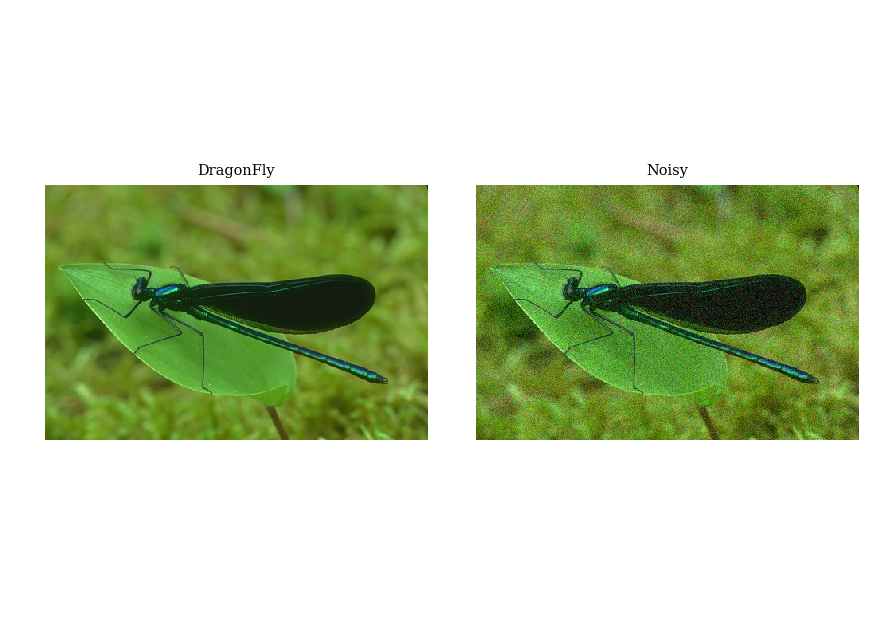

<IPython.core.display.Javascript object>


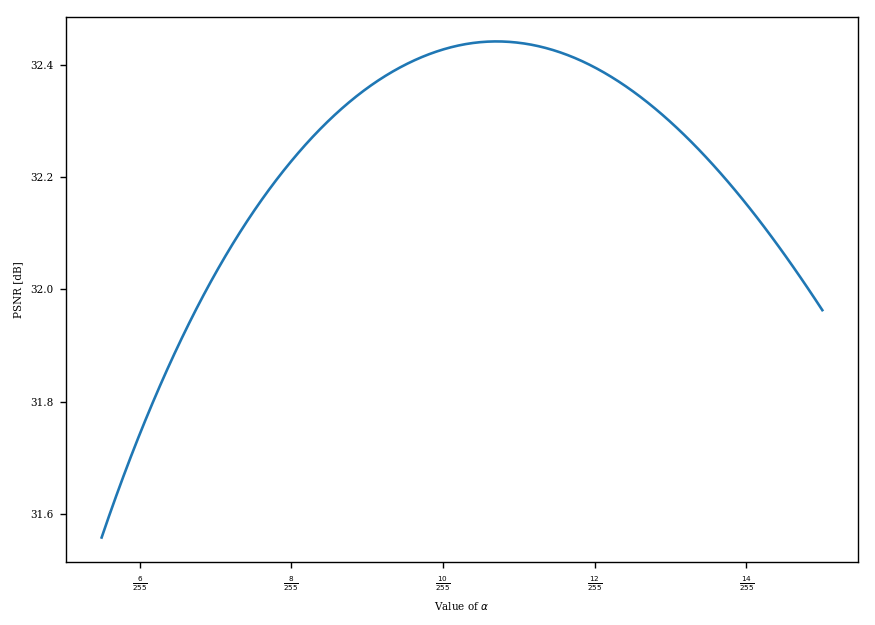

In [24]:
plt.figure(figsize=(7,5))
plt.subplot(1,2,1)
im.show(x0)
plt.title("DragonFly")
plt.subplot(1,2,2)
im.show(y)
plt.title("Noisy")
plt.figure(figsize=(7,5))
plt.plot(alpha_value, psnr_arr1)
plt.xticks([6/255,8/255,10/255,12/255,14/255],
           [r"$\frac{6}{255}$",r"$\frac{8}{255}$",r"$\frac{10}{255}$",
                    r"$\frac{12}{255}$",r"$\frac{14}{255}$"])
plt.xlabel("Value of $\\alpha$")
plt.ylabel("PSNR [dB]")
plt.show()

In [45]:
x0 = plt.imread('assets/dragonfly.png')
W_u_recur = im.UDWT(x0.shape, J=3, name='db2', using_fb=False)
sig = 20 / 255
y = x0 + sig * np.random.randn(*x0.shape)
alpha_value = np.linspace(5.5/255, 15/255,100)
psnr_arr2 = np.zeros(100)
t5 = time.time()
for i in range(100):
    psnr_arr2[i] = psnr(softthresh_denoise(y, sig, W_u_recur, alpha=alpha_value[i]),x0)
t6 = time.time()-t5

<IPython.core.display.Javascript object>


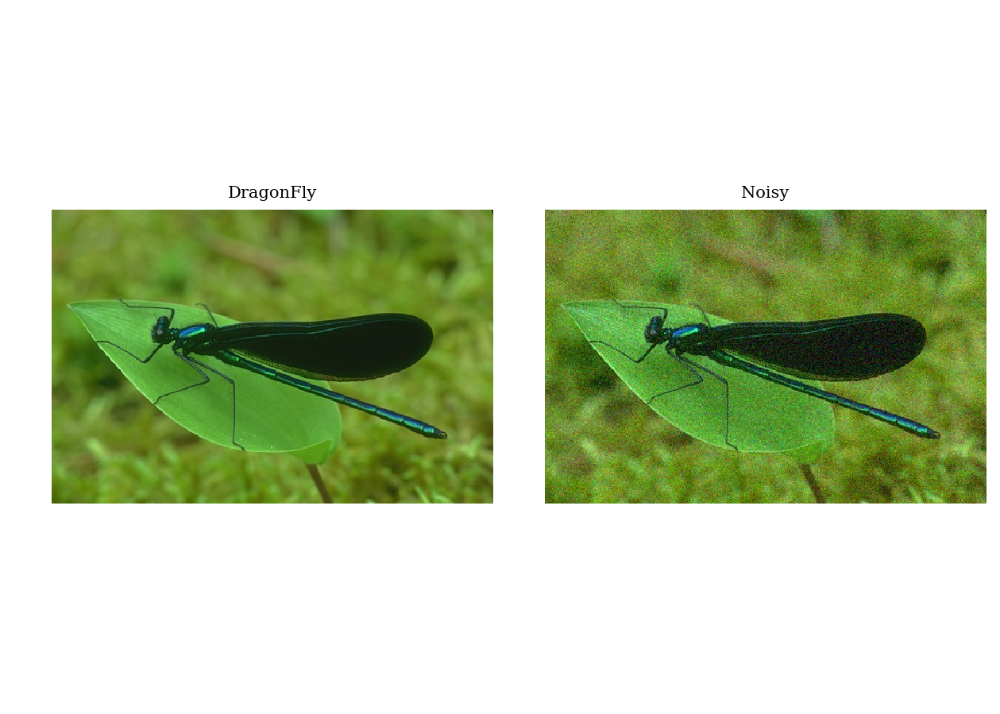

<IPython.core.display.Javascript object>


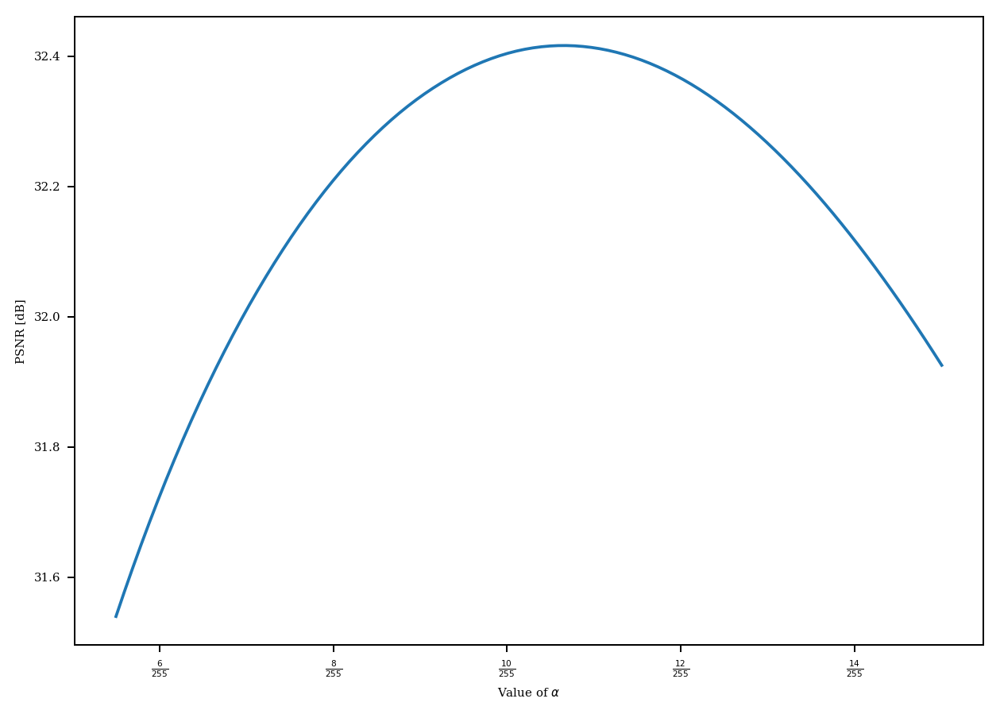

DWT time(s): 17.97 sec
UDWT filterbank time: 218.77 sec
UDWT recursive time: 191.32 sec


In [46]:
plt.figure(figsize=(7,5))
plt.subplot(1,2,1)
im.show(x0)
plt.title("DragonFly")
plt.subplot(1,2,2)
im.show(y)
plt.title("Noisy")
plt.figure(figsize=(7,5))
plt.plot(alpha_value, psnr_arr2)
plt.xticks([6/255,8/255,10/255,12/255,14/255],
           [r"$\frac{6}{255}$",r"$\frac{8}{255}$",r"$\frac{10}{255}$",
                r"$\frac{12}{255}$",r"$\frac{14}{255}$"])
plt.xlabel("Value of $\\alpha$")
plt.ylabel("PSNR [dB]")
plt.show()
print("DWT time(s): "+ "{0:.2f}".format(t2) + ' sec')
print("UDWT filterbank time: "+ "{0:.2f}".format(t4) + ' sec')
print("UDWT recursive time: "+ "{0:.2f}".format(t6) + ' sec')

Result looks like what was expected, a gain of ~1 dB in UDWT compared to DWT likely due to translation invariance from removing the decimation. Also, we see that the UDWT is slower than the DWT, but this has a caveat in that the filterbank also took a while to generate. If we run the UDWT implementation without the creation of the filter bank, it'll be faster than the recursive approach as expected from theory.

## 4 Wavelet Based Image Restoration

#### 22.

In [38]:
def energy(x,y,sig,W,H,alpha=10/255):
    Lbd = W.power()*alpha
    m = np.prod(y.shape) 
    n = np.prod(W(x).shape)  # not pretty but it works
    tau = np.sqrt(2*np.sqrt(m/n))*(sig**2)
    e1 = 0.5*(np.linalg.norm((y-H(x)))**2)
    e2 = tau*np.linalg.norm((W(x)/Lbd).reshape(-1,1),ord=1)
    #e = e1+e2
    return e1+e2

def sparse_analysis_regularization(y, sig, W, H=None, m=40, \
            alpha=10/255, gamma=1, return_energy=False):
    if H is None:
         H = Identity(y.shape)
            
    m_ener = np.prod(y.shape) 
    Lbd = alpha*W.power()
    x_k_tilda = H.adjoint(y)
    z_k_tilda = W(x_k_tilda)
    d_x_k, d_z_k = 0, 0
    e = [] if return_energy else None
    
    for i in range(m):
        # perform step of algorithm
        x_k1 = H.gram_resolvent(x_k_tilda+d_x_k+gamma*H.adjoint(y),gamma)
        n = np.prod(W(x_k1).shape) 
        tau = np.sqrt(2*np.sqrt(m_ener/n))*(sig**2)
        z_k1 = softthresh(z_k_tilda+d_z_k, (tau*gamma)/(Lbd))
        x_k1_tilda = W.gram_resolvent(x_k1-d_x_k + W.adjoint(z_k1-d_z_k),1)
        z_k1_tilda = W(x_k1_tilda)
        d_x_k1 = d_x_k - x_k1 + x_k1_tilda
        d_z_k1 = d_z_k - z_k1 + z_k1_tilda

        # update "k"
        x_k_tilda, z_k_tilda = x_k1_tilda, z_k1_tilda
        d_x_k, d_z_k = d_x_k1, d_z_k1
        # get energy
        if return_energy:
            e.append(energy(x_k1,y,sig,W,H,alpha))
        
    x = x_k1    
    if return_energy:
        return x, e
    return x

#### 23.

In [33]:
x0 = plt.imread('assets/dragonfly.png')
x1 = im.dtw_crop(x0,3)
sig = 20 / 255
y1 = x1 + sig * np.random.randn(*x1.shape)
W_dwt = im.DWT(y1.shape, name ='db2',J=3)
res_dwt = sparse_analysis_regularization(y1,sig,W_dwt, H=None, m=40)

In [34]:
x0 = plt.imread('assets/dragonfly.png')
sig = 20 / 255
y2 = x1 + sig * np.random.randn(*x1.shape)
W_udwt = im.UDWT(y2.shape, name ='db2',J=3)
res_udwt = sparse_analysis_regularization(y2,sig,W_udwt, H=None, m=40)

<IPython.core.display.Javascript object>


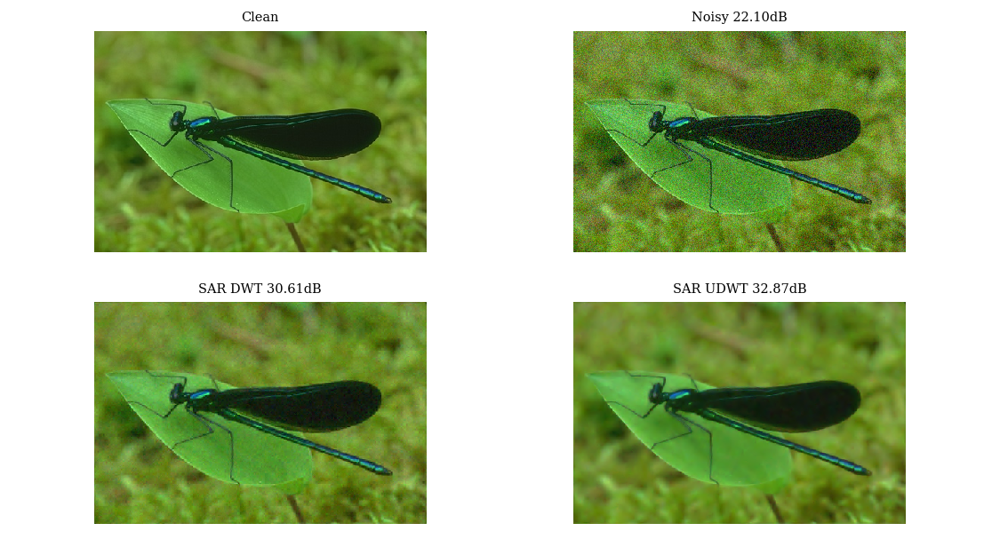

In [39]:
plt.figure(figsize=(9,5))
#plt.suptitle('Denoising SAR results for H identity')
plt.subplot(2,2,1)
im.show(x0)
plt.title("Clean")
plt.subplot(2,2,2)
im.show(y1)
plt.title("Noisy " +"{0:.2f}".format(psnr(x1,y1)) +'dB')
plt.subplot(2,2,3)
im.show(res_dwt)
plt.title("SAR DWT " + "{0:.2f}".format(psnr(x1,res_dwt))+'dB')
plt.subplot(2,2,4)
im.show(res_udwt)
plt.title("SAR UDWT " + "{0:.2f}".format(psnr(x1,res_udwt)) + 'dB')
plt.show()

The above is a comparison of SAR for different W. Next we show a comparison of SAR UDWT with the soft thresholding solution.

<IPython.core.display.Javascript object>


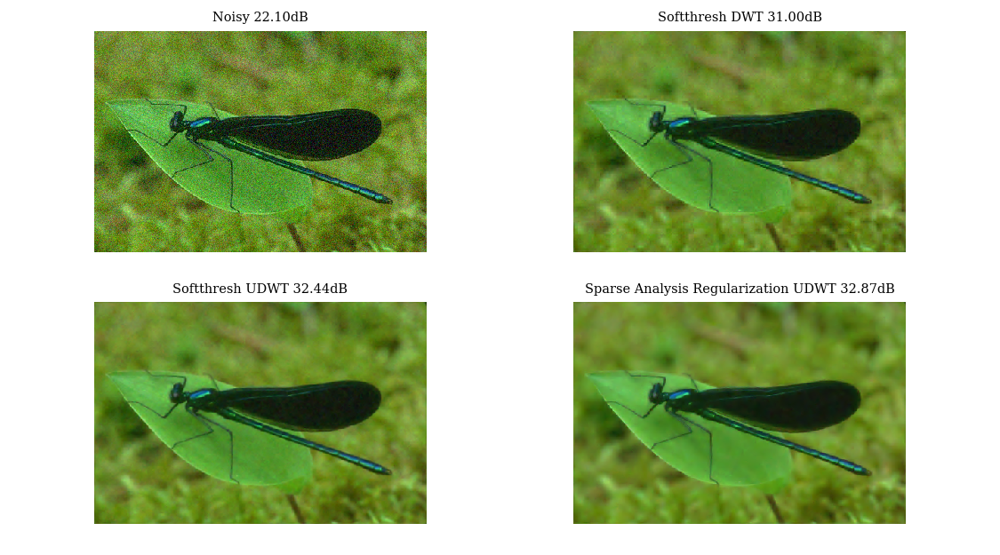

In [48]:
plt.figure(figsize=(9,5))
#plt.suptitle('SAR&softthresh comparison for H identity')
plt.subplot(2,2,1)
im.show(y1)
plt.title("Noisy " +"{0:.2f}".format(psnr(x1,y1)) +'dB')
plt.subplot(2,2,2)
im.show(best_softthresh_dwt)
plt.title("Softthresh DWT " +"{0:.2f}".format(best_softthresh_dwt_snr) +'dB')
plt.subplot(2,2,3)
im.show(best_softthresh_udwt)
plt.title("Softthresh UDWT " + "{0:.2f}".format(best_softthresh_udwt_snr)+'dB')
plt.subplot(2,2,4)
im.show(res_udwt)
plt.title("Sparse Analysis Regularization UDWT " + "{0:.2f}".format(psnr(x1,res_udwt)) + 'dB')
plt.show()

Results are almost identical to what was expected, algorithm provides significant improvment to single iterations.

<IPython.core.display.Javascript object>


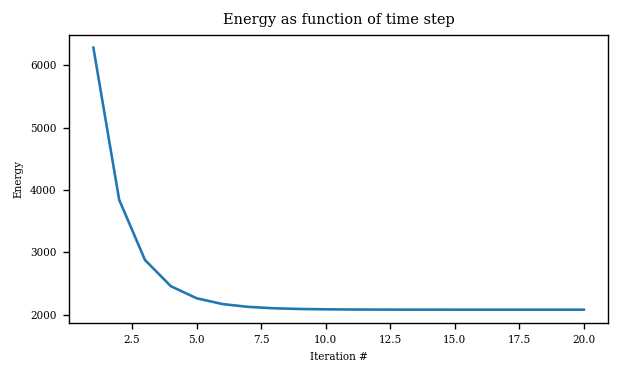

In [40]:
# for energy testing purposes
x0 = plt.imread('assets/dragonfly.png')
x1 = im.dtw_crop(x0,3)
sig = 20 / 255
y1 = x1 + sig * np.random.randn(*x1.shape)
W_dwt = im.DWT(y1.shape, name ='db2',J=3)
test, test_ener = sparse_analysis_regularization(y1,sig,W_dwt, m=20,return_energy = True)
plt.plot(np.linspace(1,20, 20),test_ener)
plt.xlabel('Iteration #')
plt.ylabel('Energy')
plt.title('Energy as function of time step')
plt.show()

We can see that there is a sharp decrease in energy after 5 iterations, while after 8 iterations the energy plateaus almost completely, indicating that doing 40 iterations of the algorithm is redundant.

#### 24.

In [71]:
x0 = plt.imread('assets/topgun.png')
x1 = im.dtw_crop(x0,3)
nu = im.kernel("motion")
H_conv = Convolution(x1.shape,nu)
sig = 2 / 255
y1 = H_conv(x1) + sig * np.random.randn(*x1.shape)
W_dwt = im.DWT(y1.shape, name ='db2',J=3)
res_dwt_conv = sparse_analysis_regularization(y1,sig,W_dwt, H=H_conv, m=40,alpha=10/255, gamma=100)

In [72]:
W_udwt = im.UDWT(y1.shape, name ='db2',J=3)
res_udwt_conv = sparse_analysis_regularization(y1,sig,W_udwt, H=H_conv, m=40,alpha=10/255, gamma=100)

<IPython.core.display.Javascript object>


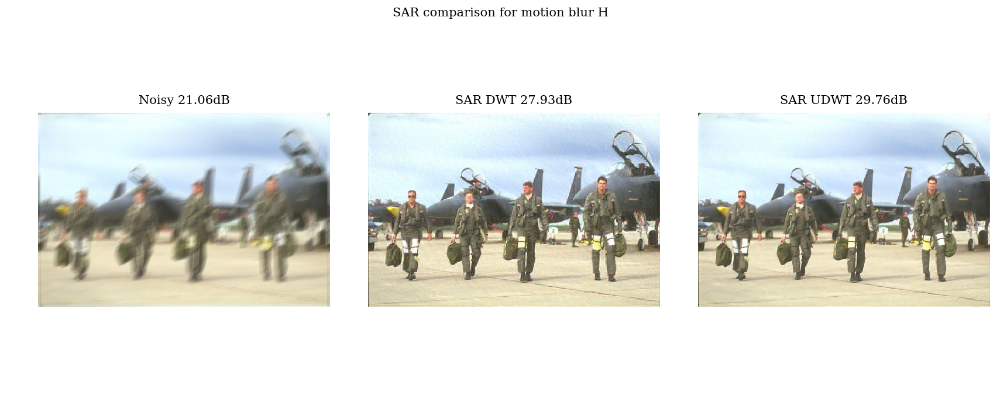

In [73]:
plt.figure(figsize=(9.5,4))
plt.suptitle('SAR comparison for motion blur H')
plt.subplot(1,3,1)
im.show(y1)
plt.title("Noisy " +"{0:.2f}".format(psnr(x1,y1)) +'dB')
plt.subplot(1,3,2)
im.show(res_dwt_conv)
plt.title("SAR DWT " + "{0:.2f}".format(psnr(x1,res_dwt_conv))+'dB')
plt.subplot(1,3,3)
im.show(res_udwt_conv)
plt.title("SAR UDWT " + "{0:.2f}".format(psnr(x1,res_udwt_conv))+'dB')
plt.show()

#### 25.

In [49]:
x0 = plt.imread('assets/topgun.png')
x1 = im.dtw_crop(x0,3)
nu = im.kernel("motion")
sig = 2 / 255
H_RM = RandomMasking(x1.shape, p = 0.4)
y1 = H_RM(x1) + sig * np.random.randn(*x1.shape)
W_dwt = im.DWT(y1.shape, name ='db2',J=3)
res_dwt_RM = sparse_analysis_regularization(y1,sig,W_dwt, H=H_RM, m=40,alpha=10/255, gamma=100)

In [50]:
W_udwt = im.UDWT(y1.shape, name ='db2',J=3)
res_udwt_RM = sparse_analysis_regularization(y1,sig,W_udwt, H=H_RM, m=40,alpha=10/255, gamma=100)

<IPython.core.display.Javascript object>


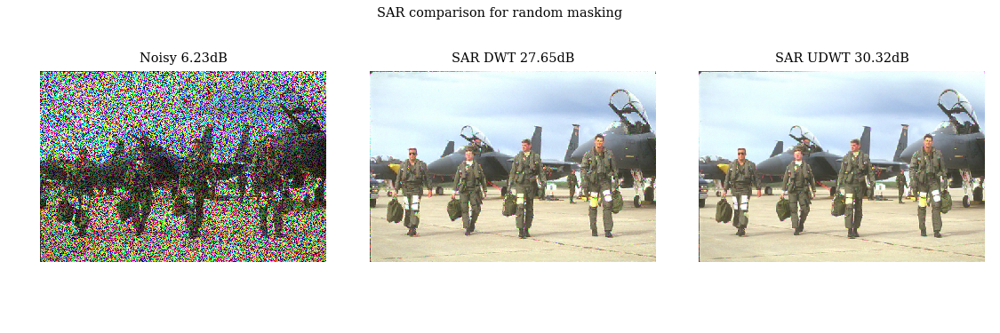

In [51]:
plt.figure(figsize=(9,3))
plt.suptitle('SAR comparison for random masking')
plt.subplot(1,3,1)
im.show(y1)
plt.title("Noisy " +"{0:.2f}".format(psnr(x1,y1)) +'dB')
plt.subplot(1,3,2)
im.show(res_dwt_RM)
plt.title("SAR DWT " + "{0:.2f}".format(psnr(x1,res_dwt_RM))+'dB')
plt.subplot(1,3,3)
im.show(res_udwt_RM)
plt.title("SAR UDWT " + "{0:.2f}".format(psnr(x1,res_udwt_RM))+'dB')
plt.show()

Results look as expected, the SAR algorithm is able to provide very impressive results, especially with UDWT. In particular for random masking, SAR UDWT improved the noisy image by ~24 dB, massive improvement.

### Bonus

## Comparison with Scikit-learn function

Note that for the first section we compared our implementation with both of scikit-learn's: 'BayesShrink', an adaptive thresholding method which is derived in a Bayesian framework; and 'VisuShrink', where a single “universal threshold” is applied to all wavelet detail coefficients. Since 'VisuShrink' performed worse than 'BayesShrink' every time, the comparison in the next sections will be only with 'BayesShrink'.

Also, soft thresholding was used for the sklearn one: mode = 'soft', because that chooses the best approximation.

In [52]:
from skimage.restoration import (denoise_wavelet, estimate_sigma)

In [53]:
x0 = plt.imread('assets/topgun.png')
x1 = im.dtw_crop(x0,3)
our_res, sklr_res_b, sklr_res_v,sig_arr = [], [], [], []
our_t, sklr_res_b_t, sklr_res_v_t = [],[],[]

for i in range(1,51):
    sig = 2/255 * i
    y = x1 + sig * np.random.randn(*x1.shape)
    sig_arr.append(sig)
    W_dwt = im.DWT(y1.shape, name ='db2',J=3)
    t0 = time.time()
    our_rec = softthresh_denoise(y, sig, W_dwt, alpha=10/255)
    our_t.append(time.time()-t0)
    t1 = time.time()
    sklr_rec_b = denoise_wavelet(y, multichannel=True, convert2ycbcr=True,
                        method='BayesShrink', mode='soft',sigma=sig)
    sklr_res_b_t.append(time.time()-t1)
    t2 = time.time()
    sklr_rec_v = denoise_wavelet(y, multichannel=True, convert2ycbcr=True,
                        method='VisuShrink', mode='soft',sigma=sig)
    sklr_res_v_t.append(time.time()-t2)
    
    sklr_res_b.append(psnr(sklr_rec_b,x1))
    sklr_res_v.append(psnr(sklr_rec_v,x1))
    our_res.append(psnr(our_rec,x1))

C:\Users\Arik\Anaconda3\lib\site-packages\skimage\restoration\_denoise.py:491: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return pywt.waverecn(denoised_coeffs, wavelet)[original_extent]


<IPython.core.display.Javascript object>


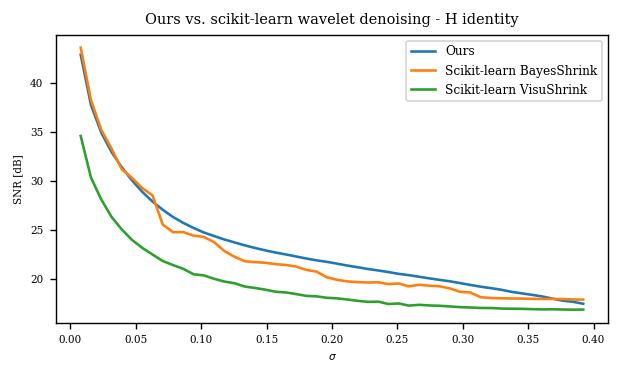

In [54]:
plt.figure()
plt.plot(sig_arr,our_res)
plt.plot(sig_arr,sklr_res_b)
plt.plot(sig_arr,sklr_res_v)
plt.xlabel('$\\sigma$')
plt.ylabel('SNR [dB]')
plt.title('Ours vs. scikit-learn wavelet denoising - H identity')
plt.legend(['Ours','Scikit-learn BayesShrink','Scikit-learn VisuShrink'])
plt.show()

We can see that for the most part, our implementation is a actually a bit better than Scikit-learn's in terms of PSNR. An example of the quality of the reconstruction is shown next.

In [59]:
sig = 10/255
y = x1 + sig * np.random.randn(*x1.shape)
W_dwt = im.DWT(y.shape, name ='db2',J=3)
our_rec = softthresh_denoise(y, sig, W_dwt, alpha=10/255)
sklr_rec_b = denoise_wavelet(y, multichannel=True, convert2ycbcr=True,
                    method='BayesShrink', mode='soft',sigma=sig)
sklr_rec_v = denoise_wavelet(y, multichannel=True, convert2ycbcr=True,
                   method='VisuShrink', mode='soft',sigma=sig)

C:\Users\Arik\Anaconda3\lib\site-packages\skimage\restoration\_denoise.py:491: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return pywt.waverecn(denoised_coeffs, wavelet)[original_extent]


<IPython.core.display.Javascript object>


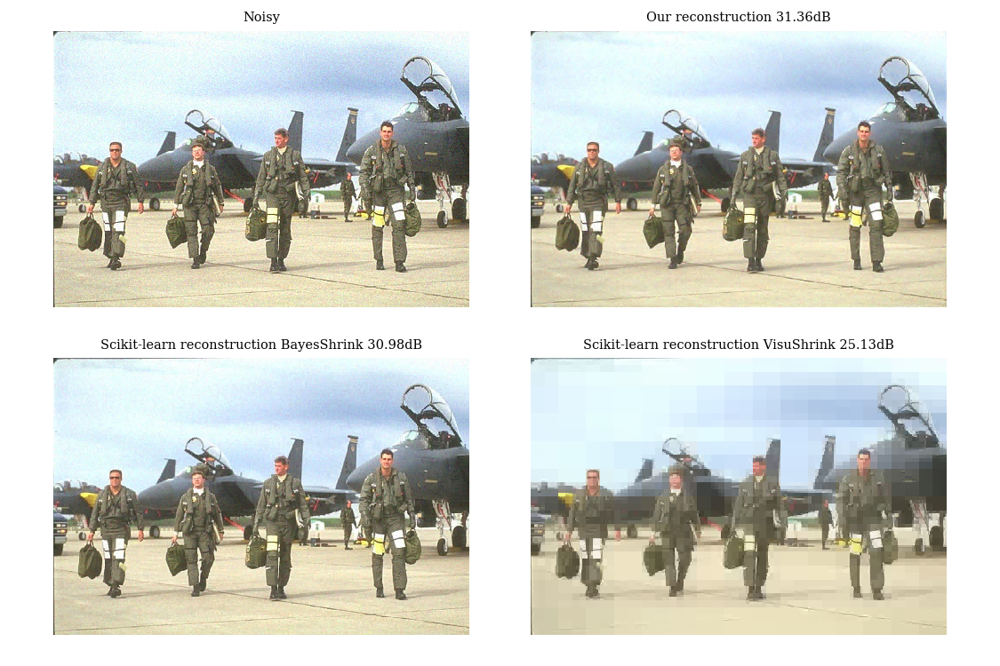

In [60]:
plt.figure(figsize=(9,6))
plt.subplot(2,2,1)
im.show(y)
plt.title("Noisy")
plt.subplot(2,2,2)
im.show(our_rec)
plt.title('Our reconstruction ' + "{0:.2f}".format(psnr(x1,our_rec))+'dB')
plt.subplot(2,2,3)
im.show(sklr_rec_b)
plt.title('Scikit-learn reconstruction BayesShrink ' + "{0:.2f}".format(psnr(x1,sklr_rec_b))+'dB')
plt.subplot(2,2,4)
im.show(sklr_rec_v)
plt.title('Scikit-learn reconstruction VisuShrink ' + "{0:.2f}".format(psnr(x1,sklr_rec_v))+'dB')
plt.show()

Our method seems to preserve edges and smooth regions a bit better than scikit-learn's.

Next, we compared the run time of both methods:

<IPython.core.display.Javascript object>


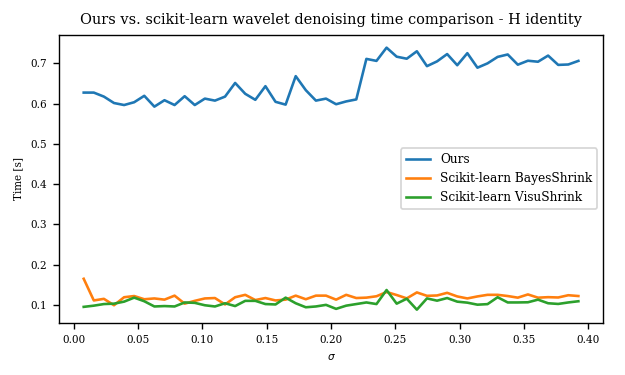

In [61]:
plt.figure()
plt.plot(sig_arr,our_t)
plt.plot(sig_arr,sklr_res_b_t)
plt.plot(sig_arr,sklr_res_v_t)
plt.xlabel('$\\sigma$')
plt.ylabel('Time [s]')
plt.title('Ours vs. scikit-learn wavelet denoising time comparison - H identity')
plt.legend(['Ours','Scikit-learn BayesShrink','Scikit-learn VisuShrink'])
plt.show()

As we can see, our implementation is about 6-7x slower than scikit-learn's, could be because of our homemade convolution function or the less than ideal workstation this program is run on. Even still, the results are quite good and the running times don't vary much for different noise levels.

In the next section, we repeat this analysis for H being random masking and convolution with motion kernel. As mentioned, we do this only for BayesShrink, as it performs better than VisuShrink with similar run time.

In [62]:
x0 = plt.imread('assets/starfish.png')
x1 = im.dtw_crop(x0,3)
nu = im.kernel("motion")
H = Convolution(x1.shape,nu)
our_res, sklr_res_b,sig_arr = [], [], []
our_t, sklr_res_b_t = [],[]

for i in range(1,51):
    sig = 2/255 * i
    y = H(x1) + sig*np.random.randn(*x1.shape)
    sig_arr.append(sig)
    W_dwt = im.DWT(y.shape, name ='db2',J=3)
    t0 = time.time()
    our_rec = softthresh_denoise(y, sig, W_dwt, alpha=10/255)
    our_t.append(time.time()-t0)
    our_res.append(psnr(our_rec,x1))
    
    t1 = time.time()
    sklr_rec_b = denoise_wavelet(y, multichannel=True, convert2ycbcr=True,
                        method='BayesShrink', mode='soft',sigma=sig)
    sklr_res_b_t.append(time.time()-t1)
    sklr_res_b.append(psnr(sklr_rec_b,x1))

C:\Users\Arik\Anaconda3\lib\site-packages\skimage\restoration\_denoise.py:491: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return pywt.waverecn(denoised_coeffs, wavelet)[original_extent]


<IPython.core.display.Javascript object>


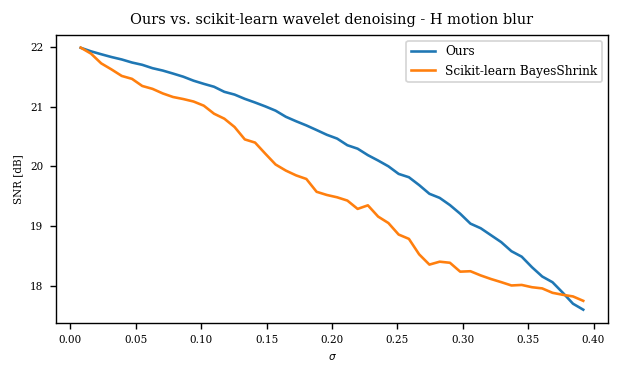

In [63]:
plt.figure()
plt.plot(sig_arr,our_res)
plt.plot(sig_arr,sklr_res_b)
plt.xlabel('$\\sigma$')
plt.ylabel('SNR [dB]')
plt.title('Ours vs. scikit-learn wavelet denoising - H motion blur')
plt.legend(['Ours','Scikit-learn BayesShrink'])
plt.show()

Again, except for high levels of noise, or method performs better. Notice the considerable drop in PSNR values due to the application of a motion blur. A sample of the comparisons is shown next, after which we repeat the run time comparisons:

In [64]:
sig = 5/255
y = H(x1) + sig * np.random.randn(*x1.shape)
W_dwt = im.DWT(y.shape, name ='db2',J=3)
our_rec = softthresh_denoise(y, sig, W_dwt, alpha=10/255)
sklr_rec_b = denoise_wavelet(y, multichannel=True, convert2ycbcr=True,
                    method='BayesShrink', mode='soft',sigma=sig)

C:\Users\Arik\Anaconda3\lib\site-packages\skimage\restoration\_denoise.py:491: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return pywt.waverecn(denoised_coeffs, wavelet)[original_extent]


<IPython.core.display.Javascript object>


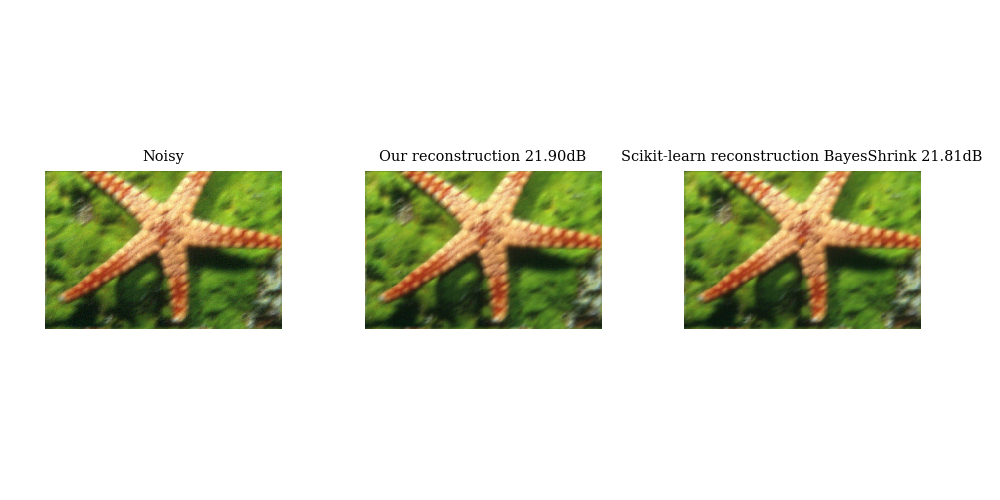

In [65]:
plt.figure(figsize=(8,4))
#plt.suptitle('Sample reconstruction results for H motion blur')
plt.subplot(1,3,1)
im.show(y)
plt.title("Noisy")
plt.subplot(1,3,2)
im.show(our_rec)
plt.title('Our reconstruction ' + "{0:.2f}".format(psnr(x1,our_rec))+'dB')
plt.subplot(1,3,3)
im.show(sklr_rec_b)
plt.title('Scikit-learn reconstruction BayesShrink ' + "{0:.2f}".format(psnr(x1,sklr_rec_b))+'dB')
plt.show()

<IPython.core.display.Javascript object>


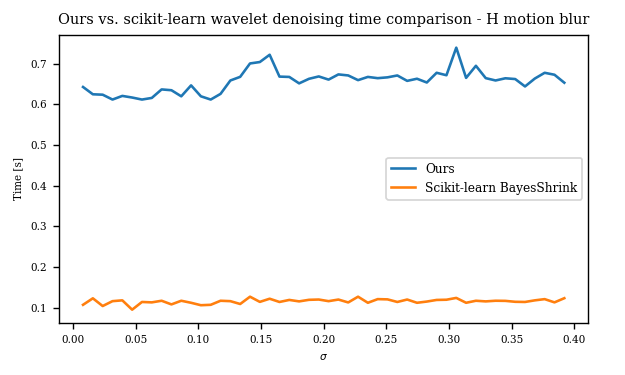

In [66]:
plt.figure()
plt.plot(sig_arr,our_t)
plt.plot(sig_arr,sklr_res_b_t)
plt.xlabel('$\\sigma$')
plt.ylabel('Time [s]')
plt.title('Ours vs. scikit-learn wavelet denoising time comparison - H motion blur')
plt.legend(['Ours','Scikit-learn BayesShrink'])
plt.show()

Our method is yet again slower. Finally we compare the results of applying a random masking with p = 0.1:

In [67]:
x0 = plt.imread('assets/dragonfly.png')
x1 = im.dtw_crop(x0,3)
H = RandomMasking(x1.shape, p = 0.1)
our_res, sklr_res_b,sig_arr = [], [], []
our_t, sklr_res_b_t = [],[]

for i in range(1,51):
    sig = 1/255 * i
    y = H(x1) + sig*np.random.randn(*x1.shape)
    sig_arr.append(sig)
    W_dwt = im.DWT(y.shape, name ='db2',J=3)
    t0 = time.time()
    our_rec = softthresh_denoise(y, sig, W_dwt, alpha=10/255)
    our_t.append(time.time()-t0)
    our_res.append(psnr(our_rec,x1))
    
    t1 = time.time()
    sklr_rec_b = denoise_wavelet(y, multichannel=True, convert2ycbcr=True,
                        method='BayesShrink', mode='soft',sigma=sig)
    sklr_res_b_t.append(time.time()-t1)
    sklr_res_b.append(psnr(sklr_rec_b,x1))

C:\Users\Arik\Anaconda3\lib\site-packages\skimage\restoration\_denoise.py:491: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return pywt.waverecn(denoised_coeffs, wavelet)[original_extent]


<IPython.core.display.Javascript object>


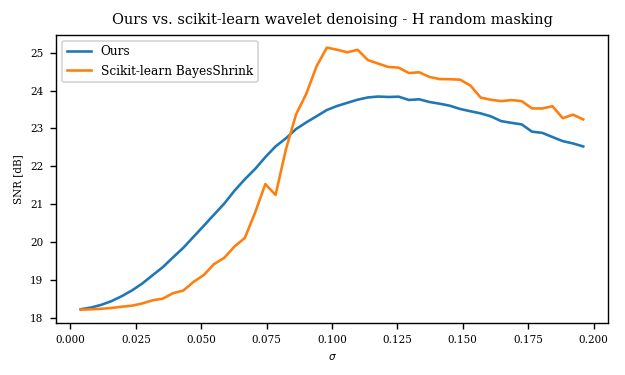

In [68]:
plt.figure()
plt.plot(sig_arr,our_res)
plt.plot(sig_arr,sklr_res_b)
plt.xlabel('$\\sigma$')
plt.ylabel('SNR [dB]')
plt.title('Ours vs. scikit-learn wavelet denoising - H random masking')
plt.legend(['Ours','Scikit-learn BayesShrink'])
plt.show()

In [69]:
sig = 25/255
y = H(x1) + sig * np.random.randn(*x1.shape)
W_dwt = im.DWT(y.shape, name ='db2',J=3)
our_rec = softthresh_denoise(y, sig, W_dwt, alpha=10/255)
sklr_rec_b = denoise_wavelet(y, multichannel=True, convert2ycbcr=True,
                    method='BayesShrink', mode='soft',sigma=sig)

C:\Users\Arik\Anaconda3\lib\site-packages\skimage\restoration\_denoise.py:491: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return pywt.waverecn(denoised_coeffs, wavelet)[original_extent]


<IPython.core.display.Javascript object>


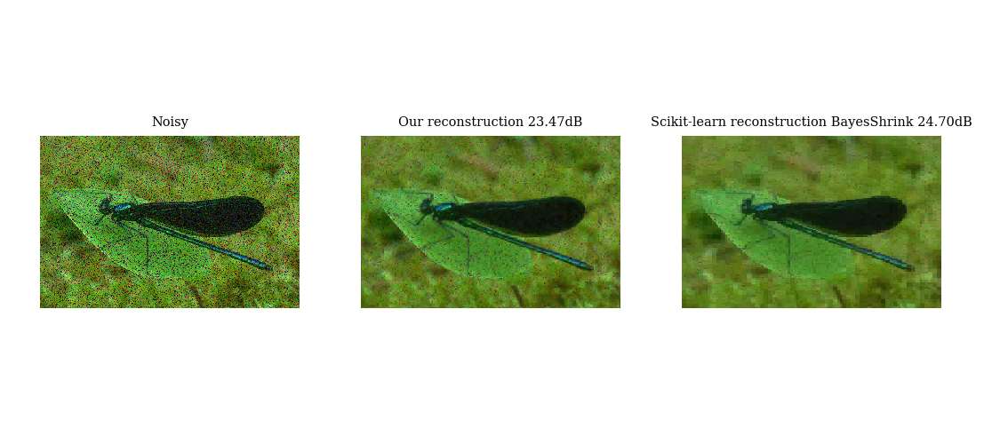

In [70]:
plt.figure(figsize=(9,4))
#plt.suptitle('Sample reconstruction results for H random masking')
plt.subplot(1,3,1)
im.show(y)
plt.title("Noisy")
plt.subplot(1,3,2)
im.show(our_rec)
plt.title('Our reconstruction ' + "{0:.2f}".format(psnr(x1,our_rec))+'dB')
plt.subplot(1,3,3)
im.show(sklr_rec_b)
plt.title('Scikit-learn reconstruction BayesShrink ' + "{0:.2f}".format(psnr(x1,sklr_rec_b))+'dB')
plt.show()

<IPython.core.display.Javascript object>


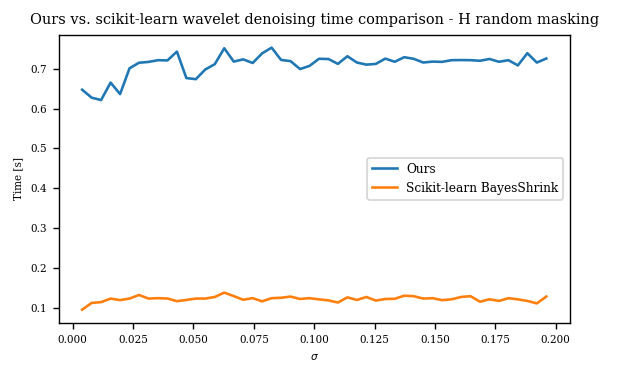

In [71]:
plt.figure()
plt.plot(sig_arr,our_t)
plt.plot(sig_arr,sklr_res_b_t)
plt.xlabel('$\\sigma$')
plt.ylabel('Time [s]')
plt.title('Ours vs. scikit-learn wavelet denoising time comparison - H random masking')
plt.legend(['Ours','Scikit-learn BayesShrink'])
plt.show()

Interestingly, in this case our implementation performs better for lower noise values only. It seems scikit-learn's implementation can better handle the combination of random masking and additive noise than ours.

In summary, it seems that our method performs better than the scikit-learn one, albeit slower. However, there are 2 caveats to keep in mind here:

1. We use optimal parameter $\alpha$ for the reconstruction.
2. We assume we know the noise levels.

In practice, we could extract the optimal $\alpha$ like we did previously by averaging. However, we cannot assume to know the noise levels in advance. Fortunately, scikit-learn has a function to estimate this noise level. We repeat the performance comparison above for an unknown noise level, using scikit-learn's estimation as the input to our soft thresholding. Timing comparisons are not repeated as the results are of similar nature.

In [127]:
x0 = plt.imread('assets/topgun.png')
x1 = im.dtw_crop(x0,3)
our_res, sklr_res_b,sig_arr = [], [], []
for i in range(1,51):
    sig = 2/255 * i
    y = x1 + sig * np.random.randn(*x1.shape)
    sig_arr.append(sig)
    sig = estimate_sigma(y, multichannel=True, average_sigmas=True)
    W_dwt = im.DWT(y1.shape, name ='db2',J=3)
    our_rec = softthresh_denoise(y, sig, W_dwt, alpha=10/255)
    sklr_rec_b = denoise_wavelet(y, multichannel=True, convert2ycbcr=True,
                        method='BayesShrink', mode='soft',sigma=sig)
    sklr_res_b.append(psnr(sklr_rec_b,x1))
    our_res.append(psnr(our_rec,x1))

<IPython.core.display.Javascript object>


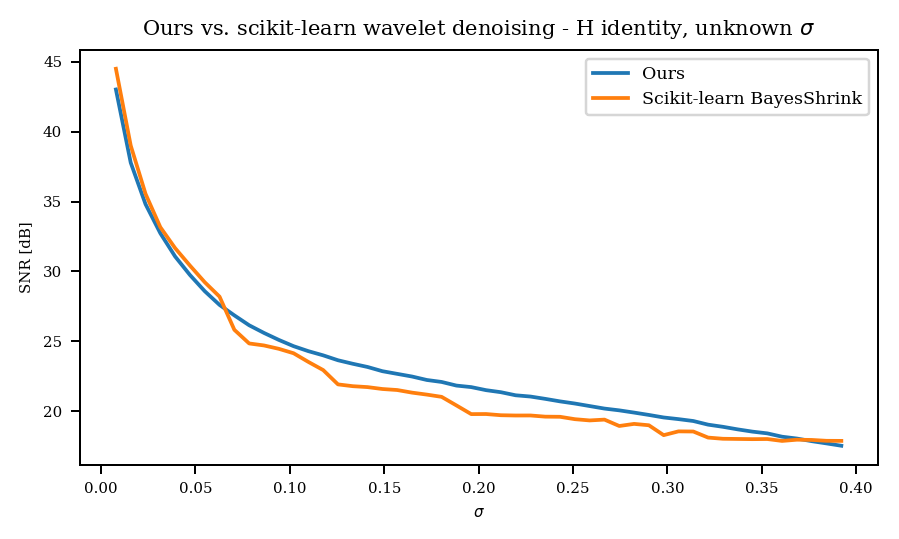

In [128]:
plt.figure()
plt.plot(sig_arr,our_res)
plt.plot(sig_arr,sklr_res_b)
plt.xlabel('$\\sigma$')
plt.ylabel('SNR [dB]')
plt.title('Ours vs. scikit-learn wavelet denoising - H identity, unknown $\\sigma$')
plt.legend(['Ours','Scikit-learn BayesShrink'])
plt.show()

In [129]:
x0 = plt.imread('assets/topgun.png')
x1 = im.dtw_crop(x0,3)
our_res, sklr_res_b,sig_arr = [], [], []
nu = im.kernel("motion")
H = Convolution(x1.shape,nu)
for i in range(1,51):
    sig = 2/255 * i
    y = H(x1) + sig * np.random.randn(*x1.shape)
    sig_arr.append(sig)
    sig = estimate_sigma(y, multichannel=True, average_sigmas=True)
    W_dwt = im.DWT(y1.shape, name ='db2',J=3)
    our_rec = softthresh_denoise(y, sig, W_dwt, alpha=10/255)
    sklr_rec_b = denoise_wavelet(y, multichannel=True, convert2ycbcr=True,
                        method='BayesShrink', mode='soft',sigma=sig)
    sklr_res_b.append(psnr(sklr_rec_b,x1))
    our_res.append(psnr(our_rec,x1))

<IPython.core.display.Javascript object>


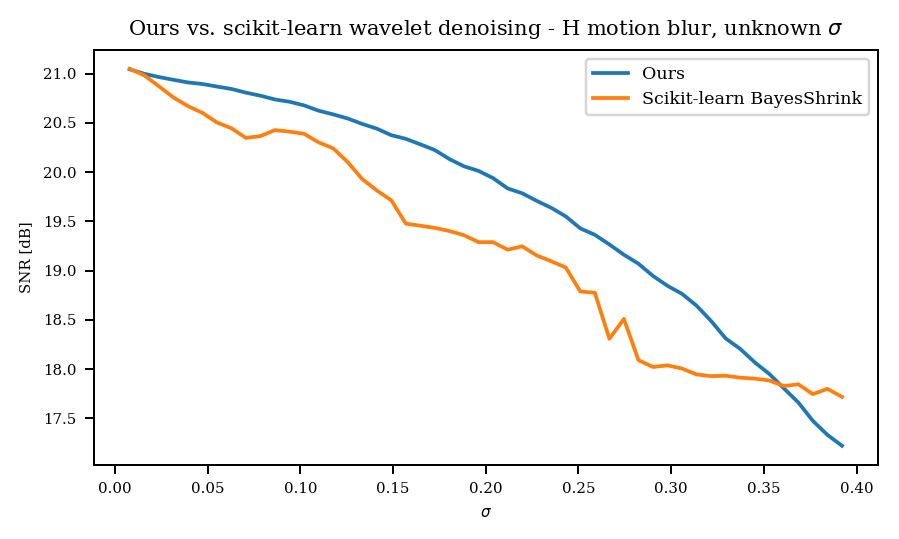

In [130]:
plt.figure()
plt.plot(sig_arr,our_res)
plt.plot(sig_arr,sklr_res_b)
plt.xlabel('$\\sigma$')
plt.ylabel('SNR [dB]')
plt.title('Ours vs. scikit-learn wavelet denoising - H motion blur, unknown $\\sigma$')
plt.legend(['Ours','Scikit-learn BayesShrink'])
plt.show()

In [131]:
x0 = plt.imread('assets/topgun.png')
x1 = im.dtw_crop(x0,3)
our_res, sklr_res_b,sig_arr = [], [], []
H = RandomMasking(x1.shape, p = 0.1)
for i in range(1,51):
    sig = 2/255 * i
    y = H(x1) + sig * np.random.randn(*x1.shape)
    sig_arr.append(sig)
    sig = estimate_sigma(y, multichannel=True, average_sigmas=True)
    W_dwt = im.DWT(y1.shape, name ='db2',J=3)
    our_rec = softthresh_denoise(y, sig, W_dwt, alpha=10/255)
    sklr_rec_b = denoise_wavelet(y, multichannel=True, convert2ycbcr=True,
                        method='BayesShrink', mode='soft',sigma=sig)
    sklr_res_b.append(psnr(sklr_rec_b,x1))
    our_res.append(psnr(our_rec,x1))

<IPython.core.display.Javascript object>


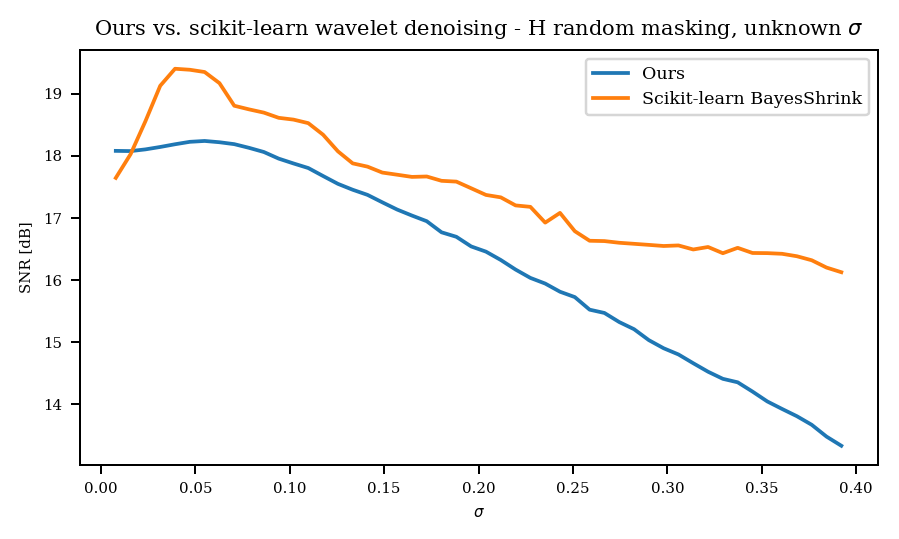

In [132]:
plt.figure()
plt.plot(sig_arr,our_res)
plt.plot(sig_arr,sklr_res_b)
plt.xlabel('$\\sigma$')
plt.ylabel('SNR [dB]')
plt.title('Ours vs. scikit-learn wavelet denoising - H random masking, unknown $\\sigma$')
plt.legend(['Ours','Scikit-learn BayesShrink'])
plt.show()

Interestingly, our algorithm actually performs better than scikit-learn's except for random masking, now moreso than when we knew the noise levels. This shows the robustness of our approach. However, for random masking our algorithm seems to have difficulty now that the noise level is unknown, and performs worse comparatively than before. In general all the results are worse when the noise level is unknown, naturally as the estimate will never be completely true.

### In summary, these results show that our algorithm is actually quite robust and performs very well, even compared with commercially available solutions. 

###### We will promptly send our CV's with a copy of the results to Scikit-learn's headquarters.